# **Life Expectancy Analysis**


*   **Data Source:** The data is sourced from WHO, covering the period from 2000 to 2015 for 193 countries, including variables such as life expectancy, health factors, and associated economic factors. (more detail: [Life Expectancy](https://www.kaggle.com/datasets/kumarajarshi/life-expectancy-who))
*   **Objective:**


1.   Data Manipulation
2.   Data Quality Check
3.   Exploratory Data Analysis with Plots










In [ ]:
# import libraries that are frequently used
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

from sklearn.impute import KNNImputer

In [ ]:
import warnings
warnings.filterwarnings("ignore")

# 📖 Import table

In [ ]:
# https://drive.google.com/file/d/1fe0r0dtM50_57sQVxZA9METpDcbBa3Hq/view?usp=drive_link
!gdown 1fe0r0dtM50_57sQVxZA9METpDcbBa3Hq

Downloading...
From: https://drive.google.com/uc?id=1fe0r0dtM50_57sQVxZA9METpDcbBa3Hq
To: /content/Life Expectancy Data.csv
100% 333k/333k [00:00<00:00, 35.7MB/s]


In [ ]:
# import data
df = pd.read_csv('/content/Life Expectancy Data.csv')

# 📖 Get to know your data

## Shape
In pandas, the '**shape**' command returns the number of rows and columns.

In [ ]:
print(df.shape)
print(f'Table has',df.shape[0], 'rows and', df.shape[1],'columns.')

(2938, 22)
Table has 2938 rows and 22 columns.


## Info
The '**Info**' command returns data type and non-null count.

In [ ]:
df.info()

# option:.dtypes
# df.dtypes

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2938 entries, 0 to 2937
Data columns (total 22 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   Country                          2938 non-null   object 
 1   Year                             2938 non-null   int64  
 2   Status                           2938 non-null   object 
 3   Life expectancy                  2928 non-null   float64
 4   Adult Mortality                  2928 non-null   float64
 5   infant deaths                    2938 non-null   int64  
 6   Alcohol                          2744 non-null   float64
 7   percentage expenditure           2938 non-null   float64
 8   Hepatitis B                      2385 non-null   float64
 9   Measles                          2938 non-null   int64  
 10   BMI                             2904 non-null   float64
 11  under-five deaths                2938 non-null   int64  
 12  Polio               

## Head/Tail
The '**Head**' or '**Tail**' command returns the first/last few rows (default is 5), providing a quick overview of its contents.

In [ ]:
pd.set_option('display.max_columns', None)
df.head(3)
# df.tail()

,Country,Year,Status,Life expectancy,Adult Mortality,infant deaths,Alcohol,percentage expenditure,Hepatitis B,Measles,BMI,under-five deaths,Polio,Total expenditure,Diphtheria,HIV/AIDS,GDP,Population,thinness 1-19 years,thinness 5-9 years,Income composition of resources,Schooling
0,Afghanistan,2015,Developing,65.0,263.0,62,0.01,71.279624,65.0,1154,19.1,83,6.0,8.16,65.0,0.1,584.259210,33736494.0,17.2,17.3,0.479,10.1
1,Afghanistan,2014,Developing,59.9,271.0,64,0.01,73.523582,62.0,492,18.6,86,58.0,8.18,62.0,0.1,612.696514,327582.0,17.5,17.5,0.476,10.0
2,Afghanistan,2013,Developing,59.9,268.0,66,0.01,73.219243,64.0,430,18.1,89,62.0,8.13,64.0,0.1,631.744976,31731688.0,17.7,17.7,0.470,9.9


## Statistical Info
The '**describe**' and '**quantile**' command return descriptive statistics of numeric features.

In [ ]:
df.describe()

,Year,Life expectancy,Adult Mortality,infant deaths,Alcohol,percentage expenditure,Hepatitis B,Measles,BMI,under-five deaths,Polio,Total expenditure,Diphtheria,HIV/AIDS,GDP,Population,thinness 1-19 years,thinness 5-9 years,Income composition of resources,Schooling
count,2938.000000,2928.000000,2928.000000,2938.000000,2744.000000,2938.000000,2385.000000,2938.000000,2904.000000,2938.000000,2919.000000,2712.00000,2919.000000,2938.000000,2490.000000,2.286000e+03,2904.000000,2904.000000,2771.000000,2775.000000
mean,2007.518720,69.224932,164.796448,30.303948,4.602861,738.251295,80.940461,2419.592240,38.321247,42.035739,82.550188,5.93819,82.324084,1.742103,7483.158469,1.275338e+07,4.839704,4.870317,0.627551,11.992793
std,4.613841,9.523867,124.292079,117.926501,4.052413,1987.914858,25.070016,11467.272489,20.044034,160.445548,23.428046,2.49832,23.716912,5.077785,14270.169342,6.101210e+07,4.420195,4.508882,0.210904,3.358920
min,2000.000000,36.300000,1.000000,0.000000,0.010000,0.000000,1.000000,0.000000,1.000000,0.000000,3.000000,0.37000,2.000000,0.100000,1.681350,3.400000e+01,0.100000,0.100000,0.000000,0.000000
25%,2004.000000,63.100000,74.000000,0.000000,0.877500,4.685343,77.000000,0.000000,19.300000,0.000000,78.000000,4.26000,78.000000,0.100000,463.935626,1.957932e+05,1.600000,1.500000,0.493000,10.100000
50%,2008.000000,72.100000,144.000000,3.000000,3.755000,64.912906,92.000000,17.000000,43.500000,4.000000,93.000000,5.75500,93.000000,0.100000,1766.947595,1.386542e+06,3.300000,3.300000,0.677000,12.300000
75%,2012.000000,75.700000,228.000000,22.000000,7.702500,441.534144,97.000000,360.250000,56.200000,28.000000,97.000000,7.49250,97.000000,0.800000,5910.806335,7.420359e+06,7.200000,7.200000,0.779000,14.300000
max,2015.000000,89.000000,723.000000,1800.000000,17.870000,19479.911610,99.000000,212183.000000,87.300000,2500.000000,99.000000,17.60000,99.000000,50.600000,119172.741800,1.293859e+09,27.700000,28.600000,0.948000,20.700000


In [ ]:
# min(), max(), mean(), median()

print(f'pd min:', df['Life expectancy '].min())
print(f'np min:', np.min(df['Life expectancy ']))

print(f'pd max:', df['Life expectancy '].max())
print(f'np max:', np.max(df['Life expectancy ']))

print(f'pd mean:', df['Life expectancy '].mean())
print(f'np mean:', np.mean(df['Life expectancy ']))

print(f'pd median:', df['Life expectancy '].median())
print(f'np median:', np.median(df['Life expectancy ']))

pd min: 36.3
np min: 36.3
pd max: 89.0
np max: 89.0
pd mean: 69.22493169398908
np mean: 69.22493169398908
pd median: 72.1
np median: nan


In [ ]:
# if you want to check other quantiles
df_numeric = df.select_dtypes(include=['float64', 'int64'])
df_numeric.quantile([0.1, 0.6, 0.9])

,Year,Life expectancy,Adult Mortality,infant deaths,Alcohol,percentage expenditure,Hepatitis B,Measles,BMI,under-five deaths,Polio,Total expenditure,Diphtheria,HIV/AIDS,GDP,Population,thinness 1-19 years,thinness 5-9 years,Income composition of resources,Schooling
0.1,2001.0,54.8,19.0,0.0,0.010,0.000000,44.0,0.0,11.9,0.0,52.0,2.84,49.0,0.1,161.462132,29382.5,0.8,0.8,0.387,7.7
0.6,2009.0,73.5,168.2,7.0,5.138,152.675391,94.0,55.0,49.5,8.0,95.0,6.39,95.0,0.1,3282.951349,2761516.0,4.9,4.9,0.716,12.9
0.9,2014.0,79.7,336.0,58.0,10.757,1852.947925,99.0,3580.1,61.8,87.0,99.0,9.12,99.0,4.4,23726.139730,25787136.0,9.8,9.7,0.864,15.9


## Unique Value
Let's check the time frame and the number of records for each country.

In [ ]:
# check time frame
df['Year'].unique()

array([2015, 2014, 2013, 2012, 2011, 2010, 2009, 2008, 2007, 2006, 2005,
       2004, 2003, 2002, 2001, 2000])

In [ ]:
df['Country'].value_counts()

Country
Afghanistan              16
Peru                     16
Nicaragua                16
Niger                    16
Nigeria                  16
                         ..
Niue                      1
San Marino                1
Nauru                     1
Saint Kitts and Nevis     1
Dominica                  1
Name: count, Length: 193, dtype: int64

## Subsetting (slicing) data

### select rows

In [ ]:
# Scenario1: select rows using their position
## select rows 0 through 2 (3 rows in total)
tmp = df[0:3] #[start : up to but not including]
tmp

,Country,Year,Status,Life expectancy,Adult Mortality,infant deaths,Alcohol,percentage expenditure,Hepatitis B,Measles,BMI,under-five deaths,Polio,Total expenditure,Diphtheria,HIV/AIDS,GDP,Population,thinness 1-19 years,thinness 5-9 years,Income composition of resources,Schooling
0,Afghanistan,2015,Developing,65.0,263.0,62,0.01,71.279624,65.0,1154,19.1,83,6.0,8.16,65.0,0.1,584.259210,33736494.0,17.2,17.3,0.479,10.1
1,Afghanistan,2014,Developing,59.9,271.0,64,0.01,73.523582,62.0,492,18.6,86,58.0,8.18,62.0,0.1,612.696514,327582.0,17.5,17.5,0.476,10.0
2,Afghanistan,2013,Developing,59.9,268.0,66,0.01,73.219243,64.0,430,18.1,89,62.0,8.13,64.0,0.1,631.744976,31731688.0,17.7,17.7,0.470,9.9


In [ ]:
# Scenario2: select rows based on a condition
tmp = df[df['Life expectancy '] > 60]
tmp.head(3)

,Country,Year,Status,Life expectancy,Adult Mortality,infant deaths,Alcohol,percentage expenditure,Hepatitis B,Measles,BMI,under-five deaths,Polio,Total expenditure,Diphtheria,HIV/AIDS,GDP,Population,thinness 1-19 years,thinness 5-9 years,Income composition of resources,Schooling
0,Afghanistan,2015,Developing,65.0,263.0,62,0.01,71.279624,65.0,1154,19.1,83,6.0,8.16,65.0,0.1,584.259210,33736494.0,17.2,17.3,0.479,10.1
16,Albania,2015,Developing,77.8,74.0,0,4.60,364.975229,99.0,0,58.0,0,99.0,6.00,99.0,0.1,3954.227830,28873.0,1.2,1.3,0.762,14.2
17,Albania,2014,Developing,77.5,8.0,0,4.51,428.749067,98.0,0,57.2,1,98.0,5.88,98.0,0.1,4575.763787,288914.0,1.2,1.3,0.761,14.2


In [ ]:
# Scenario3: two or more conditions
## '&','|'
tmp = df[(df['Life expectancy ']>60) & (df[' BMI ']>30)]
tmp.head(5)
# tmp = df[(df['Life expectancy ']>60) | (df[' BMI ']>30)]

,Country,Year,Status,Life expectancy,Adult Mortality,infant deaths,Alcohol,percentage expenditure,Hepatitis B,Measles,BMI,under-five deaths,Polio,Total expenditure,Diphtheria,HIV/AIDS,GDP,Population,thinness 1-19 years,thinness 5-9 years,Income composition of resources,Schooling
16,Albania,2015,Developing,77.8,74.0,0,4.60,364.975229,99.0,0,58.0,0,99.0,6.00,99.0,0.1,3954.227830,28873.0,1.2,1.3,0.762,14.2
17,Albania,2014,Developing,77.5,8.0,0,4.51,428.749067,98.0,0,57.2,1,98.0,5.88,98.0,0.1,4575.763787,288914.0,1.2,1.3,0.761,14.2
18,Albania,2013,Developing,77.2,84.0,0,4.76,430.876979,99.0,0,56.5,1,99.0,5.66,99.0,0.1,4414.723140,289592.0,1.3,1.4,0.759,14.2
19,Albania,2012,Developing,76.9,86.0,0,5.14,412.443356,99.0,9,55.8,1,99.0,5.59,99.0,0.1,4247.614380,2941.0,1.3,1.4,0.752,14.2
20,Albania,2011,Developing,76.6,88.0,0,5.37,437.062100,99.0,28,55.1,1,99.0,5.71,99.0,0.1,4437.178680,295195.0,1.4,1.5,0.738,13.3


### select columns

In [ ]:
df.columns

Index(['Country', 'Year', 'Status', 'Life expectancy ', 'Adult Mortality',
       'infant deaths', 'Alcohol', 'percentage expenditure', 'Hepatitis B',
       'Measles ', ' BMI ', 'under-five deaths ', 'Polio', 'Total expenditure',
       'Diphtheria ', ' HIV/AIDS', 'GDP', 'Population',
       ' thinness  1-19 years', ' thinness 5-9 years',
       'Income composition of resources', 'Schooling'],
      dtype='object')

In [ ]:
# Scenario1: select columns using their name
tmp = df[['Year','Adult Mortality',' BMI ']]
tmp.head(3)

,Year,Adult Mortality,BMI
0,2015,263.0,19.1
1,2014,271.0,18.6
2,2013,268.0,18.1


In [ ]:
# Scenario2: select columns using loc() or iloc()
tmp = df.loc[:, ['Year','Adult Mortality',' BMI ']]
tmp.head(3)

# df.loc[:,'Year':' BMI ']

,Year,Adult Mortality,BMI
0,2015,263.0,19.1
1,2014,271.0,18.6
2,2013,268.0,18.1


In [ ]:
tmp = df.iloc[:,[1,4,9]]
tmp.head(3)

# df.iloc[:, 2:5]

,Year,Adult Mortality,Measles
0,2015,263.0,1154
1,2014,271.0,492
2,2013,268.0,430


In [ ]:
df.iloc[1:4,2:5]

,Status,Life expectancy,Adult Mortality
1,Developing,59.9,271.0
2,Developing,59.9,268.0
3,Developing,59.5,272.0


## 🦾 on your own
Let's practice on a new dataset.

*   how many columns and rows do you have in this table
*   check if data types are correct
*   check statistical information for numeric features (starting from the 3rd feature)
*   select 'housing_median_age','median_income','median_house_value' for the first top 10 rows. (using two methods)








In [ ]:
# https://drive.google.com/file/d/1qcs8Gsdpb_gSY4dql26dvV8ffViFYENr/view?usp=drive_link
!gdown 1qcs8Gsdpb_gSY4dql26dvV8ffViFYENr

Downloading...
From: https://drive.google.com/uc?id=1qcs8Gsdpb_gSY4dql26dvV8ffViFYENr
To: /content/california_housing_train.csv
100% 1.71M/1.71M [00:00<00:00, 42.3MB/s]


In [ ]:
df_ca = pd.read_csv('/content/california_housing_train.csv')

In [ ]:
df_ca.shape

(17000, 9)

In [ ]:
df_ca.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17000 entries, 0 to 16999
Data columns (total 9 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   longitude           17000 non-null  float64
 1   latitude            17000 non-null  float64
 2   housing_median_age  17000 non-null  float64
 3   total_rooms         17000 non-null  float64
 4   total_bedrooms      17000 non-null  float64
 5   population          17000 non-null  float64
 6   households          17000 non-null  float64
 7   median_income       17000 non-null  float64
 8   median_house_value  17000 non-null  float64
dtypes: float64(9)
memory usage: 1.2 MB


In [ ]:
df_ca.describe()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value
count,17000.000000,17000.000000,17000.000000,17000.000000,17000.000000,17000.000000,17000.000000,17000.000000,17000.000000
mean,-119.562108,35.625225,28.589353,2643.664412,539.410824,1429.573941,501.221941,3.883578,207300.912353
std,2.005166,2.137340,12.586937,2179.947071,421.499452,1147.852959,384.520841,1.908157,115983.764387
min,-124.350000,32.540000,1.000000,2.000000,1.000000,3.000000,1.000000,0.499900,14999.000000
25%,-121.790000,33.930000,18.000000,1462.000000,297.000000,790.000000,282.000000,2.566375,119400.000000
50%,-118.490000,34.250000,29.000000,2127.000000,434.000000,1167.000000,409.000000,3.544600,180400.000000
75%,-118.000000,37.720000,37.000000,3151.250000,648.250000,1721.000000,605.250000,4.767000,265000.000000
max,-114.310000,41.950000,52.000000,37937.000000,6445.000000,35682.000000,6082.000000,15.000100,500001.000000


In [ ]:
df_ca.loc[0:10,['housing_median_age','median_income','median_house_value']]

,housing_median_age,median_income,median_house_value
0,15.0,1.4936,66900.0
1,19.0,1.8200,80100.0
2,17.0,1.6509,85700.0
3,14.0,3.1917,73400.0
4,20.0,1.9250,65500.0
5,29.0,3.3438,74000.0
6,25.0,2.6768,82400.0
7,41.0,1.7083,48500.0
8,34.0,2.1782,58400.0
9,46.0,2.1908,48100.0


In [ ]:
df_ca.iloc[0:10,[2,7,8]]

,housing_median_age,median_income,median_house_value
0,15.0,1.4936,66900.0
1,19.0,1.8200,80100.0
2,17.0,1.6509,85700.0
3,14.0,3.1917,73400.0
4,20.0,1.9250,65500.0
5,29.0,3.3438,74000.0
6,25.0,2.6768,82400.0
7,41.0,1.7083,48500.0
8,34.0,2.1782,58400.0
9,46.0,2.1908,48100.0


# 📖 Data Quality

## Missing Values

### Check Missing Values


*   Column Perspective
*   Row Perpective



In [ ]:
# Col - checking missing values
df.isnull().sum()

Country                              0
Year                                 0
Status                               0
Life expectancy                     10
Adult Mortality                     10
infant deaths                        0
Alcohol                            194
percentage expenditure               0
Hepatitis B                        553
Measles                              0
 BMI                                34
under-five deaths                    0
Polio                               19
Total expenditure                  226
Diphtheria                          19
 HIV/AIDS                            0
GDP                                448
Population                         652
 thinness  1-19 years               34
 thinness 5-9 years                 34
Income composition of resources    167
Schooling                          163
dtype: int64

In [ ]:
# generate a missing value table
df_missing = df.isnull().sum().reset_index()

# calculate the percentage of missing values
df_missing['proportion'] = round(df_missing[0]*100/df.shape[0], 2)

# rename columns
df_missing.columns = ['column_name', 'missing_values', 'proportion(%)']

In [ ]:
df_missing.head(22)

,column_name,missing_values,proportion(%)
0,Country,0,0.00
1,Year,0,0.00
2,Status,0,0.00
3,Life expectancy,10,0.34
4,Adult Mortality,10,0.34
5,infant deaths,0,0.00
6,Alcohol,194,6.60
7,percentage expenditure,0,0.00
8,Hepatitis B,553,18.82
9,Measles,0,0.00


In [ ]:
# Row - missing values
missing_values_count = df.isnull().sum(axis=1) # calculate the number of missing values in each row
rows_with_more_than_5_missing_values = df[missing_values_count > 5] # filter df to select only the rows where have more than 5 mising values

In [ ]:
rows_with_more_than_5_missing_values.shape

(41, 22)

In [ ]:
rows_with_more_than_5_missing_values.head(3)

,Country,Year,Status,Life expectancy,Adult Mortality,infant deaths,Alcohol,percentage expenditure,Hepatitis B,Measles,BMI,under-five deaths,Polio,Total expenditure,Diphtheria,HIV/AIDS,GDP,Population,thinness 1-19 years,thinness 5-9 years,Income composition of resources,Schooling
432,Côte d'Ivoire,2015,Developing,53.3,397.0,57,NaN,0.0,83.0,65,28.0,79,81.0,NaN,83.0,1.9,NaN,NaN,5.5,5.5,NaN,NaN
624,Cook Islands,2013,Developing,NaN,NaN,0,0.01,0.0,98.0,0,82.8,0,98.0,3.58,98.0,0.1,NaN,NaN,0.1,0.1,NaN,NaN
689,Czechia,2015,Developed,78.8,86.0,0,NaN,0.0,97.0,9,66.1,0,97.0,NaN,97.0,0.1,NaN,NaN,1.8,1.8,NaN,NaN


### Handling Missing Values


*   Remove Columns
*   Remove Rows
*   Replacement (constant values, mean, medium, ffill, bfill)
*   Interpolate （Linear, Polynomial, Spline）
*   Imputation







In [ ]:
# remove records that have missing values in target variable
df.dropna(subset=['Life expectancy '], inplace=True)

# remove records that have 5 or more missing values
df.dropna(thresh=df.shape[1]-5, inplace=True)

# drop columns
df.drop(columns=['percentage expenditure'], inplace=True)

# replacement with median
df['Adult Mortality'] = df['Adult Mortality'].fillna(df['Adult Mortality'].median())

# KNN Imputer: impute missing values based on the values of similar samples (when the missingness mechanism is related to the values of other features in the dataset)
# fillin missing value with the average of 5 nearest neighbours
knn_imputer = KNNImputer(n_neighbors=5, weights='distance') # weights='uniform'-->mean
df[['GDP']] = knn_imputer.fit_transform(df[['GDP']])

# forward fill and backward fill - time series data


In [ ]:
# col: 'Alcohol', 'Hepatitis B', ' BMI ', 'Polio', 'Diphtheria ', ' thinness  1-19 years', ' thinness 5-9 years', 'Income composition of resources', 'Schooling', 'Population', 'Total expenditure'
col1 = ['Alcohol', 'Hepatitis B', ' BMI ', 'Polio', 'Diphtheria ', ' thinness  1-19 years', ' thinness 5-9 years', 'Income composition of resources', 'Schooling']
df[col1] = df[col1].fillna(df[col1].mean())
df[['Population', 'Total expenditure']] = knn_imputer.fit_transform(df[['Population', 'Total expenditure']])

# check again
print(df.isnull().sum())
print(df.shape)

Country                            0
Year                               0
Status                             0
Life expectancy                    0
Adult Mortality                    0
infant deaths                      0
Alcohol                            0
Hepatitis B                        0
Measles                            0
 BMI                               0
under-five deaths                  0
Polio                              0
Total expenditure                  0
Diphtheria                         0
 HIV/AIDS                          0
GDP                                0
Population                         0
 thinness  1-19 years              0
 thinness 5-9 years                0
Income composition of resources    0
Schooling                          0
dtype: int64
(2891, 21)


## Outliers (boxplot, violin plot)

Outlier refers to a data point or observation that is significantly different from other observations in the dataset

![picture](https://miro.medium.com/max/9000/1*2c21SkzJMf3frPXPAR_gZA.png)

How to deal with outliers:
*   Drop
*   Set a threshold
*   Replacement





In [ ]:
df['Status'].unique()

array(['Developing', 'Developed'], dtype=object)

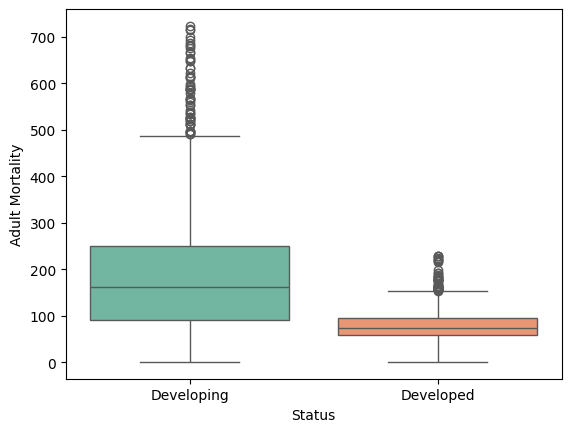

In [ ]:
# seaborn
sns.boxplot(data=df, x='Status', y='Adult Mortality',palette='Set2',orient='v')
plt.show()

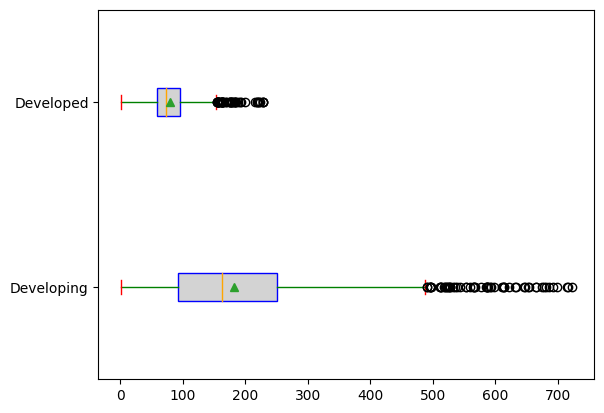

In [ ]:
# plotly

grouped_data = [df['Adult Mortality'][df['Status'] == 'Developing'],
                df['Adult Mortality'][df['Status'] == 'Developed']]

plt.boxplot(grouped_data,
            labels=['Developing', 'Developed'],
            showmeans=True,
            vert=False,
            patch_artist=True,
            boxprops=dict(facecolor="lightgrey", color="blue"),  # Color of the box
            whiskerprops=dict(color="green"),  # Color of the whiskers
            capprops=dict(color="red"),  # Color of the caps
            medianprops=dict(color="orange") # Color of the median line
            )
plt.show()

In [ ]:
# plotly express
fig = px.box(df, y='Adult Mortality',
             color='Status',
             labels={'color': 'Status Flag'},
             color_discrete_map={'Developing': 'skyblue', 'Developed': 'salmon'},
             title="Boxplot of 'Adult Mortality'")

fig.show()

In [ ]:
# violin plot
fig=px.violin(df,
              x='Status',
              y='Adult Mortality',
              color='Status',
              box=True,
              title='Life expectancy Based on Countries status')
fig.show()

### handling outliers

In [ ]:
df = df[df['infant deaths']<=1000]
df = df[df['Measles ']<=1000]
df = df[df['under-five deaths ']<=1000]
df.shape

(2377, 21)

### subplots

In [ ]:
# extract all numerical columns
numerical_cols = df.select_dtypes(include='number').columns.tolist()

print(f'we have',len(numerical_cols),'numeric variables.')

we have 19 numeric variables.


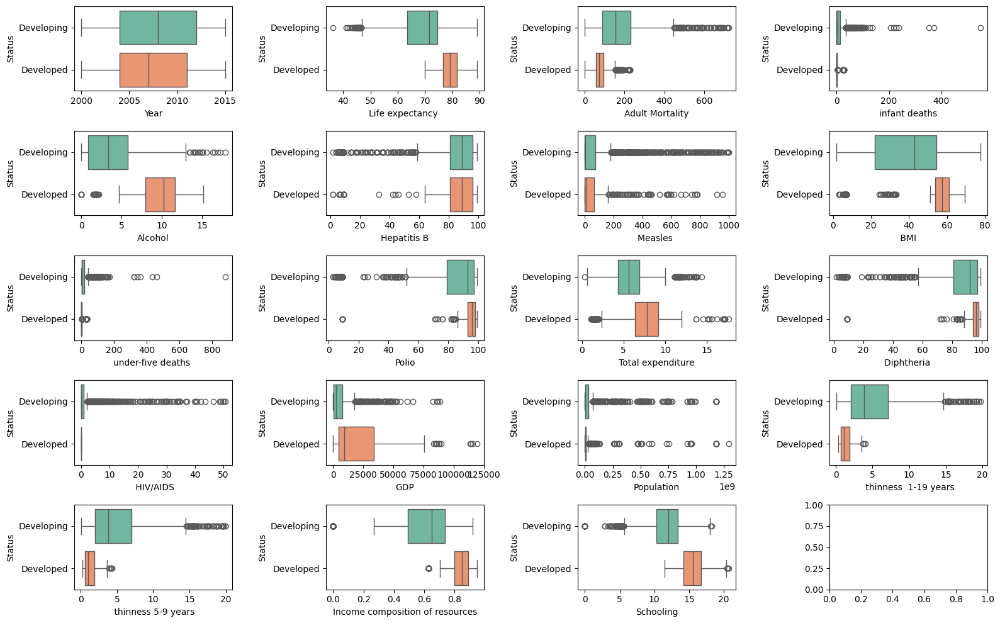

In [ ]:
#let's create multiple subplots in a single graph window
fig, axes = plt.subplots(nrows=5, ncols=4, figsize=(16, 10))

# Flatten the subgraph set into a one-dimensional array
axes_flat = axes.flatten()

# iterate cols
for i, col in enumerate(numerical_cols):
    ax = axes_flat[i]
    sns.boxplot(data=df, y='Status', x=col, orient='h', palette='Set2', ax=ax)

    ax.set_xlabel(col)
    ax.set_ylabel('Status')

plt.tight_layout()
plt.show()

If the difference between two groups for a variable is greater, it may contribute more significantly to subsequent model predictions.

## 🦾 on your own
Please check data quality of our california house table.

*   check missing values
*   try boxplot/violin plot on a numeric feature



In [ ]:
df_ca.isnull().sum()

longitude             0
latitude              0
housing_median_age    0
total_rooms           0
total_bedrooms        0
population            0
households            0
median_income         0
median_house_value    0
dtype: int64

In [ ]:
fig = px.box(df_ca,
             x='median_house_value',
             orientation='h',
             title="Boxplot of 'median_house_value'")

fig.show()

# 📖 EDA

Let's explore some stories.

### Groupby (bar, pie)
Convert a numeric feature into categorical feature.

In [ ]:
# add a new column indicating categories based on IBM values (<18.5:underweight; >=30:obese; others:normal)
df['BMI_code'] = pd.cut(df[' BMI '], bins=[-float('inf'), 18.5, 30, float('inf')], labels=['Underweight', 'Normal', 'Obese'])

In [ ]:
df.head(3)

,Country,Year,Status,Life expectancy,Adult Mortality,infant deaths,Alcohol,Hepatitis B,Measles,BMI,under-five deaths,Polio,Total expenditure,Diphtheria,HIV/AIDS,GDP,Population,thinness 1-19 years,thinness 5-9 years,Income composition of resources,Schooling,BMI_code
1,Afghanistan,2014,Developing,59.9,271.0,64,0.01,62.0,492,18.6,86,58.0,8.18,62.0,0.1,612.696514,327582.0,17.5,17.5,0.476,10.0,Normal
2,Afghanistan,2013,Developing,59.9,268.0,66,0.01,64.0,430,18.1,89,62.0,8.13,64.0,0.1,631.744976,31731688.0,17.7,17.7,0.470,9.9,Underweight
11,Afghanistan,2004,Developing,57.0,293.0,87,0.02,67.0,466,13.8,120,5.0,8.79,5.0,0.1,219.141353,24118979.0,19.5,19.7,0.381,6.8,Underweight


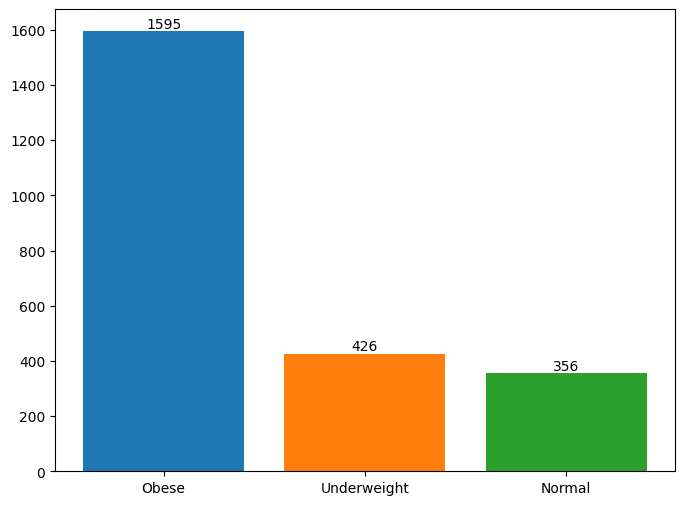

In [ ]:
sizes = df['BMI_code'].value_counts().values
labels = df['BMI_code'].value_counts().index

plt.figure(figsize=(8, 6))
bars = plt.bar(labels,sizes,color=plt.cm.tab10.colors)
for bar in bars:
    height = bar.get_height()
    plt.text(bar.get_x() + bar.get_width() / 2, height, f'{int(height)}', ha='center', va='bottom')

plt.show()

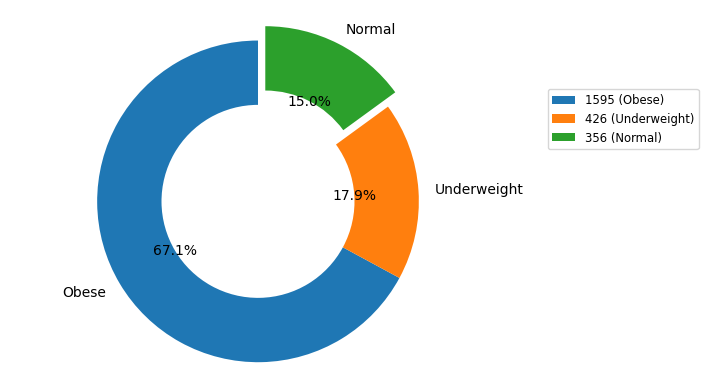

In [ ]:
explode = (0, 0, 0.1)
plt.figure()
wedges, texts, autotexts = plt.pie(sizes, labels=labels, autopct='%1.1f%%', startangle=90, explode=explode, wedgeprops=dict(width=0.4))

# Add text annotation for absolute values
absolute_values = [f'{size} ({label})' for size, label in zip(sizes, labels)]
plt.legend(wedges, absolute_values, loc="upper right", bbox_to_anchor=(1.4, 0.8), fontsize='small')

plt.axis('equal')
plt.show()

## Trend and Relationship (line chart,scatter plot)



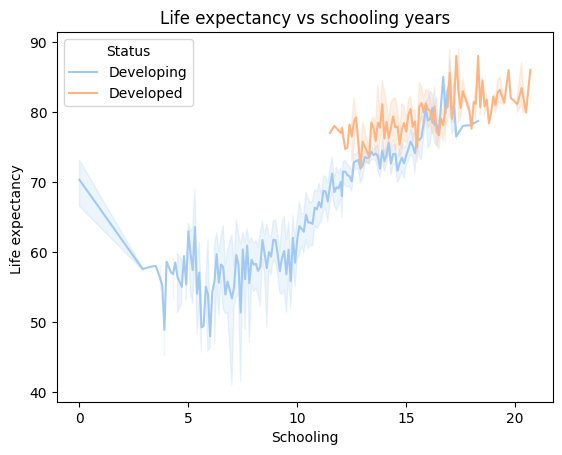

In [ ]:
# Create seaborn lineplot
sns.lineplot(data=df, x="Schooling", y="Life expectancy ", hue="Status", palette='pastel') # hue is often used to specify variables that group data so that the chart can distinguish between groups with different colors or different markup styles.

# Display the plot
plt.title('Life expectancy vs schooling years')
plt.show()

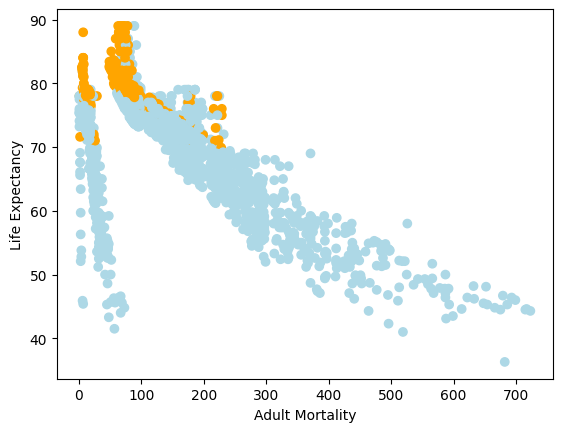

In [ ]:
colors = ['orange' if dev == 'Developed' else 'lightblue' for dev in df['Status']]

plt.scatter(df['Adult Mortality'],df['Life expectancy '], c=colors)
plt.xlabel('Adult Mortality')
plt.ylabel('Life Expectancy')
plt.show()

In [ ]:
px.scatter(df.sort_values(by='Year'),
           y='GDP',
           x='Life expectancy ',
           animation_frame='Year',
           animation_group='Country',
           color='Country',
           size='Life expectancy ',
           title='<b>Life Expectancy Versus GDP of Countries in every Year')

## Distribution (kde plot)

It describes the pattern, shape, and variability of the data.

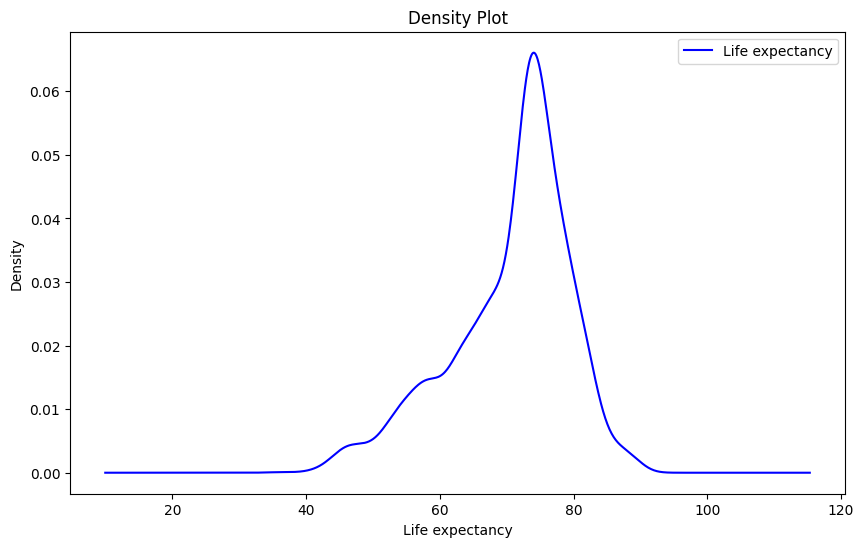

In [ ]:
plt.figure(figsize=(10, 6))
df['Life expectancy '].plot(kind='density', color='blue', label='Life expectancy')
plt.xlabel('Life expectancy')
plt.ylabel('Density')
plt.title('Density Plot')
plt.legend()
plt.show()

In [ ]:
fig = px.histogram(df, x='Life expectancy ',
                   histnorm="probability density",
                   title='Density Plot',
                   nbins=6,
                   range_x=[20,95],
                   labels={'Life expectancy': 'Life expectancy', 'value': 'Density'})

fig.show()

In [ ]:
# kernel density estimate (kde) plot
import plotly.figure_factory as ff

hist_data = [df['Life expectancy ']]
group_labels = ['Life expectancy '] # name of the dataset

fig = ff.create_distplot(hist_data, group_labels)
fig.show()

## Correlation (heatmap)

It quantifies the degree to which two variables move together in a linear manner.

Range from -1 to 1

In [ ]:
df.columns

Index(['Country', 'Year', 'Status', 'Life expectancy ', 'Adult Mortality',
       'infant deaths', 'Alcohol', 'Hepatitis B', 'Measles ', ' BMI ',
       'under-five deaths ', 'Polio', 'Total expenditure', 'Diphtheria ',
       ' HIV/AIDS', 'GDP', 'Population', ' thinness  1-19 years',
       ' thinness 5-9 years', 'Income composition of resources', 'Schooling',
       'BMI_code'],
      dtype='object')

In [ ]:
corr = df.iloc[:,3:-1].corr() #exclude 'Country', 'Year', 'Status' and 'BMI_code'
corr

,Life expectancy,Adult Mortality,infant deaths,Alcohol,Hepatitis B,Measles,BMI,under-five deaths,Polio,Total expenditure,Diphtheria,HIV/AIDS,GDP,Population,thinness 1-19 years,thinness 5-9 years,Income composition of resources,Schooling
Life expectancy,1.000000,-0.711024,-0.385102,0.397852,0.167209,-0.215031,0.526900,-0.416420,0.380011,0.200594,0.388699,-0.571583,0.432210,0.099940,-0.527002,-0.529691,0.672172,0.714631
Adult Mortality,-0.711024,1.000000,0.273735,-0.187369,-0.133077,0.144482,-0.377863,0.295686,-0.246795,-0.114544,-0.237442,0.532248,-0.280030,-0.083383,0.372152,0.377654,-0.443943,-0.453027
infant deaths,-0.385102,0.273735,1.000000,-0.189019,-0.112419,0.313043,-0.254667,0.990476,-0.213341,-0.065952,-0.215320,0.140240,-0.162665,-0.022923,0.298129,0.311730,-0.241071,-0.323230
Alcohol,0.397852,-0.187369,-0.189019,1.000000,0.045020,-0.145120,0.288182,-0.186667,0.172945,0.288923,0.180670,-0.066095,0.301570,-0.005781,-0.442715,-0.429751,0.418772,0.496863
Hepatitis B,0.167209,-0.133077,-0.112419,0.045020,1.000000,-0.091060,0.084915,-0.124416,0.405500,0.041394,0.522594,-0.112410,0.038233,0.045454,-0.022918,-0.027281,0.125530,0.125179
Measles,-0.215031,0.144482,0.313043,-0.145120,-0.091060,1.000000,-0.136011,0.311882,-0.132062,-0.066872,-0.114984,0.108422,-0.026295,-0.014341,0.230857,0.231165,-0.130380,-0.194602
BMI,0.526900,-0.377863,-0.254667,0.288182,0.084915,-0.136011,1.000000,-0.272279,0.200634,0.191116,0.204133,-0.239933,0.247846,0.101285,-0.531474,-0.536126,0.457607,0.495879
under-five deaths,-0.416420,0.295686,0.990476,-0.186667,-0.124416,0.311882,-0.272279,1.000000,-0.228230,-0.069452,-0.237580,0.159902,-0.162546,-0.032262,0.302933,0.314900,-0.260945,-0.343548
Polio,0.380011,-0.246795,-0.213341,0.172945,0.405500,-0.132062,0.200634,-0.228230,1.000000,0.118133,0.627140,-0.149520,0.174471,0.053545,-0.166159,-0.166859,0.310042,0.332574
Total expenditure,0.200594,-0.114544,-0.065952,0.288923,0.041394,-0.066872,0.191116,-0.069452,0.118133,1.000000,0.144163,-0.004479,0.109869,0.109885,-0.282758,-0.284101,0.143457,0.221158


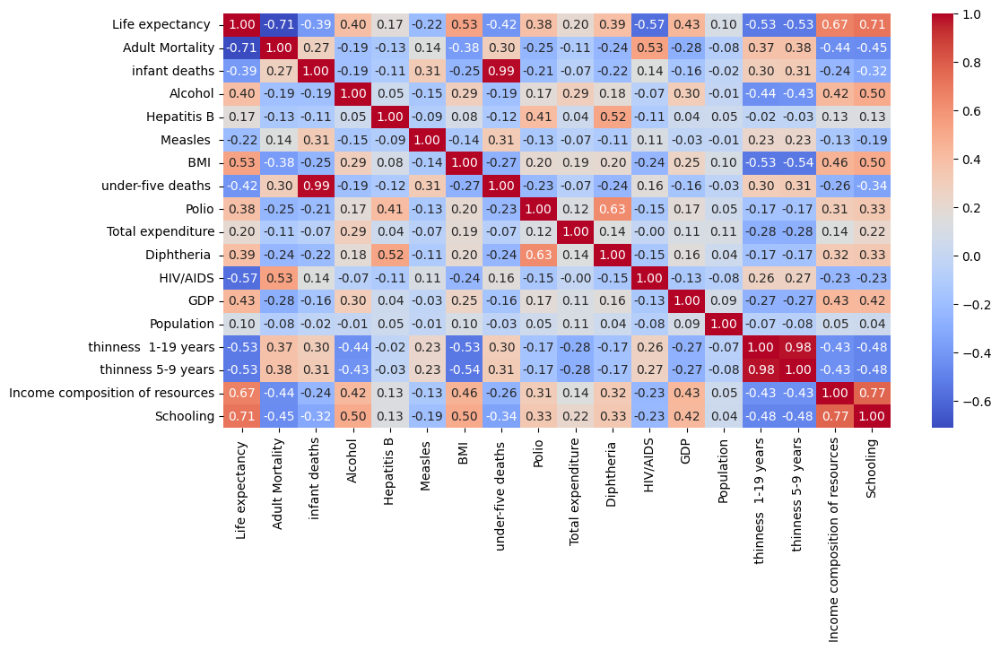

In [ ]:
plt.figure(figsize=(12, 6))
sns.heatmap(corr,
            xticklabels=corr.columns.values,
            yticklabels=corr.columns.values,
            annot=True,
            fmt='.2f',
            cmap='coolwarm')
plt.show()

In [ ]:
df_corr_pair = df.iloc[:,2:-1]

Pairplot is used to create scatter plots for each pair of numerical variables in a dataset, and histograms for each individual variable along the diagonal. It helps visualize the relationships and distributions of variables in the dataset.

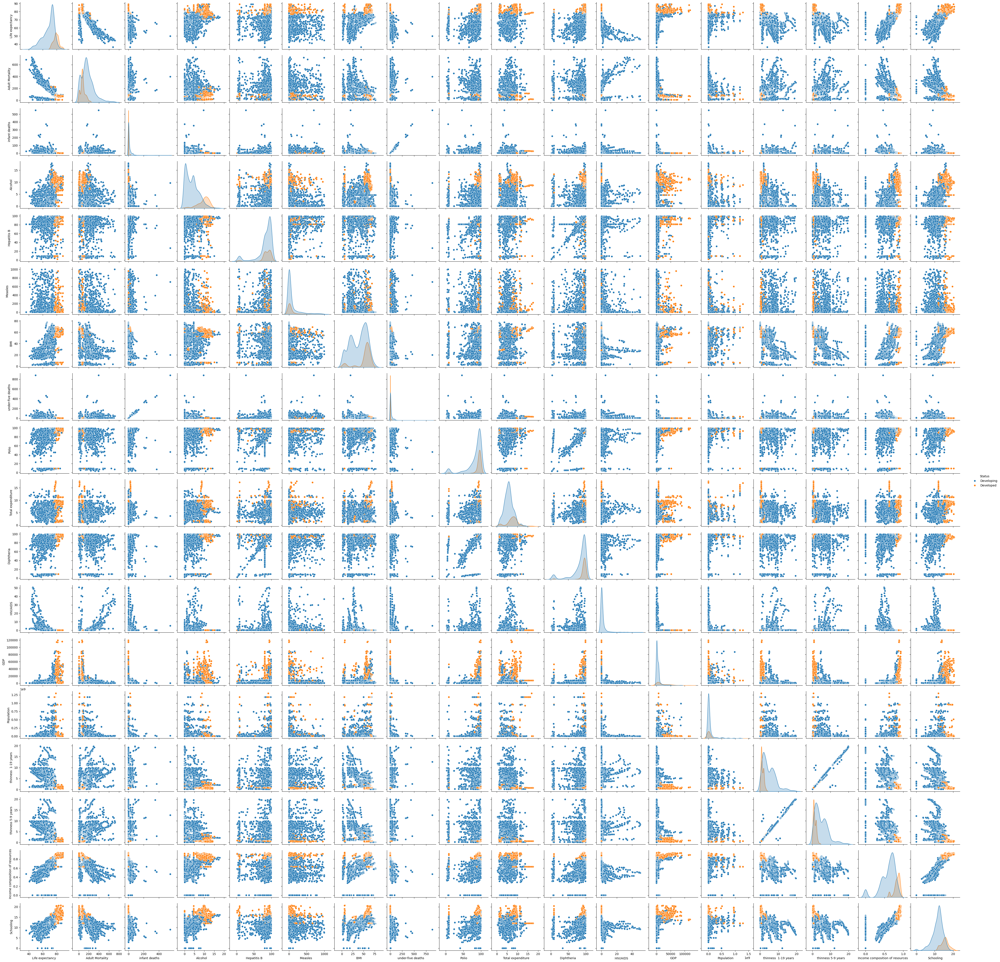

In [ ]:
sns.pairplot(df_corr_pair, hue='Status')
plt.show()

## 🦾 on your own


*   Create a new column named 'house_value_label': set as 'low' if the median house value is less than 150,000, 'high' if it exceeds 300,000, otherwise label it as 'medium'.
*   Generate a scatter plot using longitude and latitude as axes, with points colored based on the new column 'house_value_label'.
*   Plot the distribution of 'median_house_value'
*   Perform correlation analysis, starting from the 3rd feature and excluding the newly created column.






In [ ]:
df_ca['house_value_label'] = pd.cut(df_ca['median_house_value'], bins=[-float('inf'), 150000, 300000, float('inf')], labels=['low', 'medium', 'high'])

In [ ]:
df_ca

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,house_value_label
0,-114.31,34.19,15.0,5612.0,1283.0,1015.0,472.0,1.4936,66900.0,low
1,-114.47,34.40,19.0,7650.0,1901.0,1129.0,463.0,1.8200,80100.0,low
2,-114.56,33.69,17.0,720.0,174.0,333.0,117.0,1.6509,85700.0,low
3,-114.57,33.64,14.0,1501.0,337.0,515.0,226.0,3.1917,73400.0,low
4,-114.57,33.57,20.0,1454.0,326.0,624.0,262.0,1.9250,65500.0,low
...,...,...,...,...,...,...,...,...,...,...
16995,-124.26,40.58,52.0,2217.0,394.0,907.0,369.0,2.3571,111400.0,low
16996,-124.27,40.69,36.0,2349.0,528.0,1194.0,465.0,2.5179,79000.0,low
16997,-124.30,41.84,17.0,2677.0,531.0,1244.0,456.0,3.0313,103600.0,low
16998,-124.30,41.80,19.0,2672.0,552.0,1298.0,478.0,1.9797,85800.0,low


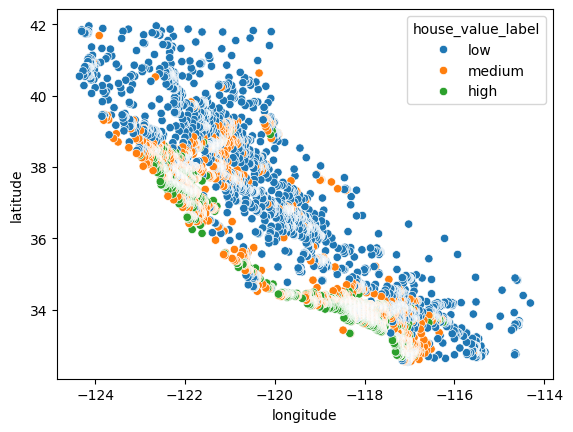

In [ ]:
sns.scatterplot(df_ca, x='longitude', y='latitude', hue='house_value_label')
plt.show()

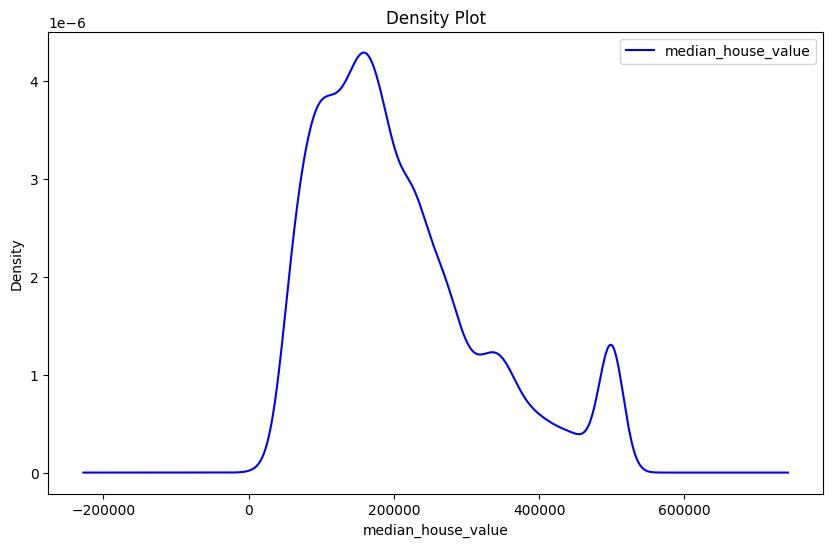

In [ ]:
plt.figure(figsize=(10, 6))
df_ca['median_house_value'].plot(kind='density', color='blue', label='median_house_value')
plt.xlabel('median_house_value')
plt.ylabel('Density')
plt.title('Density Plot')
plt.legend()
plt.show()

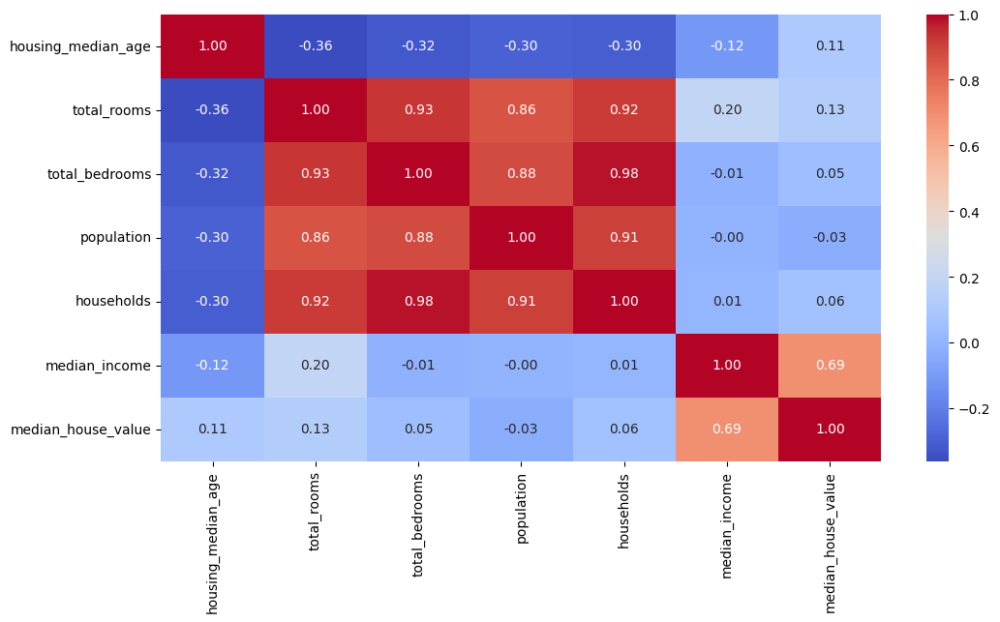

In [ ]:
corr_ca = df_ca.iloc[:,2:-1].corr()
plt.figure(figsize=(12, 6))
sns.heatmap(corr_ca,
            xticklabels=corr_ca.columns.values,
            yticklabels=corr_ca.columns.values,
            annot=True,
            fmt='.2f',
            cmap='coolwarm')
plt.show()